In [27]:
import os
import sys
import itertools
import math
import logging
import json
import re
import random
from collections import OrderedDict
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.lines as lines
from matplotlib.patches import Polygon

# Root directory of the project
ROOT_DIR = os.path.abspath("../../")
print(ROOT_DIR)

# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library
from mrcnn import utils
from mrcnn import visualize
from mrcnn.visualize import display_images
import mrcnn.model as modellib
from mrcnn.model import log

from samples.balloon import balloon

%matplotlib inline 

/home/workspace/ML/Cascade_RCNN


In [28]:
config = balloon.BalloonConfig()
BALLOON_DIR = os.path.join(ROOT_DIR, "data/balloon")
print(BALLOON_DIR)

/home/workspace/ML/Cascade_RCNN/data/balloon


## Dataset

In [4]:
# Load dataset
# Get the dataset from the releases page
# https://github.com/matterport/Mask_RCNN/releases
dataset = balloon.BalloonDataset()
dataset.load_balloon(BALLOON_DIR, "train")

# Must call before using the dataset
dataset.prepare()
dataset.class_names[1] = "Pickable"
print("Image Count: {}".format(len(dataset.image_ids)))
print("Class Count: {}".format(dataset.num_classes))
for i, info in enumerate(dataset.class_info):
    if i == 1:
        info['name']="Pickable"
    print("{:3}. {:50}".format(i, info['name']))

{'size': 3067764, 'filename': '18_02_2019_11_57_39_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [704, 691, 672, 654, 651, 644, 638, 599, 592, 556, 541, 509, 505, 516, 542, 559, 608, 786, 815, 884, 928, 938, 955, 983, 994, 1000, 1019, 1033, 1074, 1097, 1013, 991, 929, 897, 806, 784, 705], 'name': 'polyline', 'all_points_x': [543, 696, 739, 793, 825, 828, 845, 923, 947, 987, 979, 1059, 1103, 1129, 1133, 1136, 1156, 1226, 1234, 1260, 1277, 1250, 1187, 1094, 1055, 989, 956, 909, 793, 679, 654, 665, 629, 624, 577, 563, 540]}, 'region_attributes': {'multi_class_category_id': '2', 'category_id': '0', 'iscrowd': '0'}}]}
{'size': 3083216, 'filename': '15_02_2019_02_24_38_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [877, 874, 861, 856, 856, 860, 885, 980, 1135, 1198, 1296, 1363, 1373, 1378, 1383, 1383, 1386, 1388, 1393,

{'size': 3134764, 'filename': '18_02_2019_12_45_26_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [441, 426, 420, 404, 386, 342, 323, 310, 300, 283, 274, 271, 362, 476, 553, 575, 591, 673, 723, 738, 828, 994, 1168, 1251, 1244, 1258, 1289, 1313, 1345, 1364, 1379, 1383, 1376, 1369, 1363, 1354, 1134, 913, 713, 565, 459], 'name': 'polyline', 'all_points_x': [101, 231, 304, 405, 553, 916, 1102, 1213, 1241, 1307, 1338, 1350, 1345, 1361, 1369, 1368, 1377, 1389, 1390, 1397, 1416, 1438, 1461, 1469, 1352, 1260, 1056, 902, 642, 467, 312, 245, 222, 222, 235, 228, 197, 166, 143, 126, 106]}, 'region_attributes': {'multi_class_category_id': '2', 'category_id': '0', 'iscrowd': '0'}}]}
{'size': 3153979, 'filename': '15_02_2019_01_20_03_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [830, 815, 803, 780, 760, 755, 703, 679, 658, 645,

{'size': 3060460, 'filename': '15_02_2019_02_19_27_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [327, 323, 312, 302, 297, 293, 448, 688, 1003, 1043, 1055, 1061, 1063, 1069, 1073, 1071, 1068, 1068, 1070, 1069, 1070, 1073, 1067, 1066, 1069, 1072, 1070, 1076, 1072, 1069, 1069, 1069, 1066, 1071, 1086, 1088, 1091, 1094, 1067, 1056, 1047, 1003, 634, 545], 'name': 'polygon', 'all_points_x': [324, 507, 660, 775, 814, 841, 848, 856, 869, 862, 856, 855, 848, 836, 822, 800, 770, 754, 709, 696, 689, 680, 671, 652, 640, 628, 615, 607, 594, 577, 571, 564, 550, 526, 494, 471, 430, 359, 358, 362, 357, 352, 337, 336]}, 'region_attributes': {'multi_class_category_id': '3', 'category_id': '0', 'iscrowd': '0'}}]}
{'size': 3226097, 'filename': '18_02_2019_12_36_48_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [883, 851, 773, 719, 71

{'size': 3146634, 'filename': '18_02_2019_01_05_35_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [467, 473, 439, 398, 390, 357, 340, 327, 308, 314, 1190, 1249, 1262, 1305, 1345, 1338, 1350, 1352, 1360, 1329, 1311, 1281, 1163, 1105, 1034, 978, 909, 827, 771, 617, 546, 523, 465, 466], 'name': 'polyline', 'all_points_x': [140, 195, 289, 570, 726, 991, 1232, 1230, 1315, 1339, 1439, 1482, 1401, 920, 437, 380, 346, 318, 295, 252, 281, 280, 256, 254, 239, 236, 226, 213, 213, 185, 165, 166, 129, 142]}, 'region_attributes': {'category_id': '0', 'iscrowd': '0'}}]}
{'size': 3106420, 'filename': '15_02_2019_01_42_52_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [356, 359, 370, 388, 407, 415, 412, 413, 429, 438, 487, 678, 871, 1031, 1107, 1172, 1186, 1178, 1172, 1165, 1164, 1160, 1162, 1165, 1160, 1157, 1158, 1155, 1151, 1152

{'size': 3110400, 'filename': '15_02_2019_02_20_29_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [973, 645, 484, 449, 517, 659, 790, 815, 869, 1070, 1194, 1335, 1274, 1141, 1000, 976], 'name': 'polyline', 'all_points_x': [301, 598, 746, 790, 874, 1015, 1135, 1155, 1116, 922, 802, 673, 618, 472, 329, 298]}, 'region_attributes': {'multi_class_category_id': '3', 'category_id': '0', 'iscrowd': '0'}}]}
{'size': 3091056, 'filename': '18_02_2019_01_04_13_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [387, 397, 375, 383, 435, 448, 508, 627, 883, 1047, 1231, 1346, 1343, 1334, 1340, 1296, 385, 389], 'name': 'polyline', 'all_points_x': [194, 318, 1324, 1412, 1392, 1389, 1398, 1406, 1411, 1415, 1411, 1418, 496, 350, 190, 188, 186, 197]}, 'region_attributes': {'category_id': '0', 'iscrowd': '0'}}]}
{'size': 3199942, 'filename

{'size': 3061686, 'filename': '15_02_2019_01_48_05_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [388, 386, 383, 384, 383, 378, 383, 370, 374, 363, 366, 354, 349, 342, 334, 328, 328, 321, 327, 316, 307, 327, 374, 505, 684, 737, 865, 1044, 1052, 1055, 1076, 1104, 1144, 1047, 781, 552, 406], 'name': 'polyline', 'all_points_x': [99, 147, 168, 183, 202, 216, 227, 250, 263, 281, 292, 319, 334, 349, 374, 390, 404, 420, 443, 464, 481, 494, 517, 551, 586, 595, 623, 660, 665, 649, 556, 410, 259, 242, 187, 134, 101]}, 'region_attributes': {'multi_class_category_id': '3', 'category_id': '0', 'iscrowd': '0'}}]}
{'size': 3103811, 'filename': '19_02_2019_04_47_35_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [296, 284, 1415, 1420], 'name': 'polygon', 'all_points_x': [102, 863, 880, 122]}, 'region_attributes': {'multi_class_cat

{'size': 3089544, 'filename': '15_02_2019_01_36_19_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [359, 372, 368, 369, 381, 375, 375, 383, 403, 390, 403, 401, 404, 401, 405, 430, 435, 423, 496, 567, 812, 993, 1149, 1168, 1161, 1149, 1126, 1125, 1114, 398, 359], 'name': 'polyline', 'all_points_x': [484, 532, 550, 565, 621, 657, 673, 714, 768, 804, 837, 852, 861, 878, 917, 998, 1051, 1128, 1130, 1127, 1100, 1073, 1063, 1070, 1019, 904, 618, 497, 395, 474, 484]}, 'region_attributes': {'multi_class_category_id': '3', 'category_id': '0', 'iscrowd': '0'}}]}
{'size': 3210398, 'filename': '18_02_2019_12_14_49_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [911, 832, 815, 803, 777, 635, 524, 421, 397, 424, 451, 459, 463, 476, 509, 528, 685, 691, 715, 767, 795, 839, 862, 957, 1005, 1069, 1165, 1226, 1243, 1243, 1230, 1244, 1

{'size': 3060875, 'filename': '15_02_2019_02_20_56_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [683, 687, 690, 690, 686, 688, 690, 685, 742, 909, 1048, 1194, 1408, 1409, 1411, 1409, 1404, 1399, 1393, 1387, 1382, 1357, 1218, 1098, 968, 791, 733], 'name': 'polyline', 'all_points_x': [116, 174, 216, 252, 313, 476, 599, 625, 625, 624, 628, 629, 628, 586, 501, 426, 362, 287, 215, 164, 128, 111, 113, 116, 113, 112, 112]}, 'region_attributes': {'multi_class_category_id': '3', 'category_id': '0', 'iscrowd': '0'}}]}
{'size': 3099709, 'filename': '15_02_2019_02_24_24_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [687, 690, 643, 634, 621, 619, 598, 582, 569, 564, 606, 675, 760, 842, 854, 871, 953, 1119, 1267, 1399, 1225, 953, 772, 728], 'name': 'polyline', 'all_points_x': [724, 753, 951, 1025, 1055, 1074, 1135, 1179, 1216

{'size': 3176652, 'filename': '19_02_2019_10_40_17_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [390, 366, 1289, 1304, 1141], 'name': 'polygon', 'all_points_x': [4, 657, 694, 9, 2]}, 'region_attributes': {'multi_class_category_id': '0', 'category_id': '0', 'iscrowd': '0'}}, {'shape_attributes': {'all_points_y': [383, 397, 399, 387, 378, 476, 555, 637, 948, 1206, 1314, 1326, 1307, 1309, 1312, 1321, 1323, 1325, 1076, 980, 583, 455], 'name': 'polygon', 'all_points_x': [783, 1033, 1260, 1391, 1495, 1473, 1461, 1480, 1487, 1505, 1510, 1513, 1434, 1239, 1111, 992, 906, 805, 800, 816, 806, 768]}, 'region_attributes': {'multi_class_category_id': '2', 'category_id': '0', 'iscrowd': '0'}}]}
{'size': 3104391, 'filename': '18_02_2019_12_29_54_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [918, 888, 871, 821, 756, 711, 632, 

{'size': 3050507, 'filename': '18_02_2019_11_54_28_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [409, 457, 488, 518, 540, 649, 1154, 1031, 537, 409], 'name': 'polyline', 'all_points_x': [591, 766, 892, 992, 1038, 1006, 866, 421, 559, 586]}, 'region_attributes': {'multi_class_category_id': '2', 'category_id': '0', 'iscrowd': '0'}}]}
{'size': 3218406, 'filename': '19_02_2019_10_56_47_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [688, 691, 690, 682, 683, 675, 735, 1002, 1294, 1406, 1407, 1419, 1409, 1419, 1420, 1425, 1429, 1428, 1415, 1401, 1399, 1370, 1008, 739], 'name': 'polygon', 'all_points_x': [117, 229, 418, 545, 610, 637, 635, 647, 661, 661, 610, 573, 557, 492, 454, 415, 372, 347, 309, 170, 156, 148, 135, 128]}, 'region_attributes': {'multi_class_category_id': '3', 'category_id': '0', 'iscrowd': '0'}}, {'sh

{'size': 3075643, 'filename': '15_02_2019_01_50_45_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [981, 796, 591, 463, 489, 522, 521, 533, 571, 702, 1013, 1235, 1324, 1308, 1282, 1282, 1273, 1273, 1269, 1236, 1199, 1202, 1196, 1189, 1201, 1161, 1111, 982], 'name': 'polyline', 'all_points_x': [845, 902, 977, 1010, 1050, 1144, 1160, 1223, 1409, 1372, 1284, 1216, 1180, 1139, 1098, 1084, 1063, 1047, 1000, 959, 907, 889, 878, 870, 829, 806, 809, 844]}, 'region_attributes': {'multi_class_category_id': '3', 'category_id': '0', 'iscrowd': '0'}}]}
{'size': 3067602, 'filename': '15_02_2019_02_08_03_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [655, 630, 614, 599, 616, 668, 709, 724, 729, 750, 809, 931, 1052, 1186, 1257, 1261, 1252, 1228, 1182, 1143, 1129, 1110, 1103, 1093, 1037, 796, 754, 742, 729, 715, 701, 689], 'name': 

{'size': 3091900, 'filename': '18_02_2019_12_32_19_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [511, 509, 520, 525, 524, 526, 532, 534, 538, 541, 533, 521, 511, 509, 505, 501, 490, 485, 472, 453, 440, 432, 432, 485, 494, 506, 547, 739, 836, 918, 1016, 1093, 1137, 1137, 1208, 1224, 1229, 1228, 1237, 1243, 1250, 1251, 1259, 1270, 1276, 1282, 1282, 1283, 1286, 1269, 1245, 1238, 1204, 1204, 1193, 1171, 1075, 986, 900, 767, 709, 641, 561, 531], 'name': 'polyline', 'all_points_x': [420, 438, 454, 467, 482, 506, 551, 569, 590, 601, 644, 698, 730, 765, 780, 790, 816, 832, 851, 884, 914, 932, 949, 947, 935, 943, 954, 979, 997, 1010, 1025, 1040, 1049, 1090, 1101, 1084, 1050, 1018, 991, 943, 876, 825, 796, 764, 721, 656, 635, 595, 567, 511, 514, 490, 504, 515, 517, 509, 495, 489, 482, 453, 446, 438, 428, 410]}, 'region_attributes': {'multi_class_category_id': '2', 'category_id': '0', 'iscrowd': '0'}}]}
{'siz

{'size': 3134033, 'filename': '18_02_2019_11_52_06_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [428, 793, 784, 894, 968, 1011, 1038, 1073, 1081, 1122, 1167, 1197, 1181, 1111, 1059, 1020, 875, 745, 728, 668, 603, 518, 481, 427], 'name': 'polyline', 'all_points_x': [733, 1035, 1047, 1139, 1052, 1001, 964, 922, 903, 871, 833, 797, 778, 716, 672, 637, 513, 404, 389, 453, 529, 628, 678, 730]}, 'region_attributes': {'multi_class_category_id': '2', 'category_id': '0', 'iscrowd': '0'}}]}
{'size': 3093058, 'filename': '15_02_2019_01_46_18_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [572, 628, 703, 720, 760, 1012, 1112, 1213, 1364, 1401, 1414, 1416, 1393, 1400, 1396, 1392, 1395, 1374, 1366, 1363, 1355, 1348, 1341, 1341, 1332, 1328, 1323, 1326, 1317, 1316, 1311, 1296, 1272, 1238, 951, 643, 613], 'name': 'polyline', 'all

{'size': 3215063, 'filename': '20_02_2019_10_22_36_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [278, 255, 380, 752, 1025, 1029, 1029, 1025, 1029, 1042, 1047, 613, 392], 'name': 'polygon', 'all_points_x': [155, 732, 736, 748, 762, 757, 737, 711, 587, 207, 184, 162, 156]}, 'region_attributes': {'multi_class_category_id': '1', 'category_id': '0', 'iscrowd': '0'}}, {'shape_attributes': {'all_points_y': [1116, 1209, 1412, 1310], 'name': 'polygon', 'all_points_x': [119, 695, 663, 89]}, 'region_attributes': {'multi_class_category_id': '0', 'category_id': '0', 'iscrowd': '0'}}, {'shape_attributes': {'all_points_y': [640, 644, 656, 650, 657, 647, 647, 654, 656, 668, 667, 677, 671, 674, 657, 655, 655, 763, 951, 1136, 1256, 1413, 1415, 1411, 1400, 1395, 1400, 1399, 1373, 1310, 942, 709], 'name': 'polygon', 'all_points_x': [848, 932, 968, 979, 1001, 1034, 1108, 1172, 1278, 1317, 1330, 1372, 1380, 1398, 1448, 

{'size': 3214190, 'filename': '19_02_2019_08_39_32_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [411, 406, 380, 365, 347, 338, 337, 338, 349, 350, 403, 459, 494, 488, 532, 638, 687, 931, 974, 1054, 1131, 1175, 1218, 1244, 1265, 1252, 1269, 1260, 1293, 1298, 1298, 1307, 1316, 1365, 1175, 1066, 839, 685, 550], 'name': 'polygon', 'all_points_x': [40, 97, 229, 296, 393, 491, 655, 706, 751, 763, 769, 758, 759, 743, 757, 779, 792, 825, 827, 844, 852, 861, 864, 859, 827, 819, 773, 638, 542, 529, 480, 448, 426, 168, 169, 183, 129, 101, 87]}, 'region_attributes': {'multi_class_category_id': '2', 'category_id': '0', 'iscrowd': '0'}}, {'shape_attributes': {'all_points_y': [224, 211, 209, 217, 202, 197, 182, 185, 223, 238, 271, 310, 398, 479, 548, 579, 597, 601, 603, 604, 608, 603, 610, 615, 617, 624, 623, 600, 564, 499, 441, 288, 252], 'name': 'polygon', 'all_points_x': [807, 880, 926, 924, 1319, 1360, 1371, 

{'size': 3108413, 'filename': '18_02_2019_12_15_29_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [526, 489, 418, 386, 371, 363, 326, 371, 419, 465, 493, 526, 572, 642, 775, 930, 1096, 1102, 1121, 1181, 1200, 1208, 1209, 1222, 1226, 1238, 1297, 1302, 1289, 1271, 1176, 1169, 1063, 850, 732, 690, 630, 553], 'name': 'polyline', 'all_points_x': [264, 379, 585, 678, 732, 741, 814, 825, 843, 858, 868, 880, 903, 929, 979, 1033, 1087, 1090, 1031, 863, 802, 787, 773, 746, 736, 711, 528, 510, 501, 498, 458, 472, 437, 368, 331, 321, 298, 274]}, 'region_attributes': {'multi_class_category_id': '2', 'category_id': '0', 'iscrowd': '0'}}]}
{'size': 3201368, 'filename': '19_02_2019_10_57_36_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [610, 609, 607, 604, 602, 644, 831, 1093, 1277, 1409, 1408, 1402], 'name': 'polygon', 'all_poin

{'size': 3151178, 'filename': '15_02_2019_01_14_47_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [333, 274, 243, 243, 247, 321, 358, 380, 401, 411, 437, 447, 457, 475, 501, 523, 537, 552, 558, 569, 578, 584, 598, 604, 613, 623, 636, 644, 656, 665, 685, 716, 739, 791, 857, 898, 907, 922, 984, 1011], 'name': 'polygon', 'all_points_x': [592, 1009, 1199, 1221, 1304, 1324, 1338, 1355, 1349, 1349, 1365, 1372, 1370, 1370, 1374, 1383, 1385, 1382, 1379, 1381, 1388, 1392, 1389, 1393, 1396, 1396, 1398, 1398, 1399, 1401, 1398, 1389, 1385, 1382, 1386, 1389, 1374, 1238, 819, 682]}, 'region_attributes': {'multi_class_category_id': '3', 'category_id': '0', 'iscrowd': '0'}}]}
{'size': 3051195, 'filename': '15_02_2019_02_26_17_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [609, 613, 615, 616, 623, 622, 623, 619, 621, 695, 833, 992

{'size': 3088445, 'filename': '15_02_2019_01_16_45_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [703, 688, 693, 694, 694, 688, 688, 708, 797, 971, 1171, 1316, 1373, 1373, 1370, 1371, 1363, 1352, 1339, 1324, 1315, 1293, 1226, 1194, 1136, 1128, 1113, 1109, 1101, 1091, 1083, 1072, 1061, 1055, 1047, 1038, 1028, 1017, 1006, 967, 936, 916, 878, 868, 853, 842, 831, 821, 815, 804, 792, 771], 'name': 'polygon', 'all_points_x': [564, 701, 814, 1024, 1178, 1267, 1294, 1288, 1294, 1296, 1298, 1301, 1305, 1220, 747, 592, 567, 566, 573, 569, 577, 577, 573, 564, 536, 541, 540, 538, 541, 540, 538, 540, 539, 537, 540, 544, 543, 536, 532, 533, 530, 526, 535, 535, 530, 528, 535, 544, 547, 547, 553, 562]}, 'region_attributes': {'multi_class_category_id': '3', 'category_id': '0', 'iscrowd': '0'}}]}
{'size': 3078368, 'filename': '18_02_2019_12_11_26_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attr

{'size': 3087540, 'filename': '15_02_2019_01_23_26_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [1312, 1161, 974, 920, 907, 898, 887, 864, 838, 824, 819, 821, 827, 828, 834, 835, 829, 822, 818, 815, 817, 822, 825, 917, 1026, 1142, 1273, 1332, 1335, 1339, 1333, 1326, 1326, 1321, 1318], 'name': 'polygon', 'all_points_x': [659, 665, 686, 694, 687, 690, 688, 682, 678, 679, 681, 721, 771, 851, 926, 964, 1023, 1113, 1196, 1258, 1333, 1383, 1407, 1410, 1412, 1400, 1392, 1385, 1353, 1304, 1096, 851, 747, 673, 661]}, 'region_attributes': {'multi_class_category_id': '3', 'category_id': '0', 'iscrowd': '0'}}]}
{'size': 3159444, 'filename': '15_02_2019_01_20_14_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [606, 605, 633, 657, 709, 750, 781, 802, 819, 887, 950, 1093, 1268, 1316, 1435, 1416, 1399, 1384, 1369, 1363, 1343, 131

{'size': 3206548, 'filename': '19_02_2019_08_52_26_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [296, 288, 277, 283, 367, 587, 993, 1010, 1016, 716, 424, 359], 'name': 'polygon', 'all_points_x': [215, 309, 635, 717, 728, 735, 758, 278, 250, 229, 210, 202]}, 'region_attributes': {'multi_class_category_id': '3', 'category_id': '0', 'iscrowd': '0'}}, {'shape_attributes': {'all_points_y': [229, 231, 219, 216, 411, 776, 994, 1009], 'name': 'polygon', 'all_points_x': [807, 980, 1276, 1387, 1398, 1411, 1419, 833]}, 'region_attributes': {'multi_class_category_id': '1', 'category_id': '0', 'iscrowd': '0'}}, {'shape_attributes': {'all_points_y': [1129, 1116, 1571, 1583, 1127], 'name': 'polygon', 'all_points_x': [6, 1107, 1127, 2, 0]}, 'region_attributes': {'multi_class_category_id': '0', 'category_id': '0', 'iscrowd': '0'}}]}
{'size': 3164778, 'filename': '18_02_2019_12_24_52_BASLER_ACA2040_25GC_BASLERGIGE_2

{'size': 3087353, 'filename': '15_02_2019_02_21_45_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [290, 275, 268, 262, 262, 267, 345, 489, 683, 738, 746, 768, 781, 782, 782, 783, 786, 793, 798, 802, 804, 798, 680, 455, 420], 'name': 'polygon', 'all_points_x': [703, 728, 1086, 1324, 1408, 1414, 1409, 1419, 1422, 1424, 1421, 1427, 1425, 1393, 1316, 1237, 1155, 1020, 865, 784, 718, 699, 688, 697, 696]}, 'region_attributes': {'multi_class_category_id': '3', 'category_id': '0', 'iscrowd': '0'}}]}
{'size': 3124996, 'filename': '18_02_2019_12_07_05_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [721, 680, 639, 580, 549, 506, 452, 393, 411, 447, 520, 579, 681, 736, 759, 784, 805, 830, 863, 895, 930, 982, 1056, 1073, 1099, 1111, 1083, 1083, 1045, 943, 893, 842, 795, 809, 733, 721], 'name': 'polyline', 'all_points_x': [511, 

{'size': 3169961, 'filename': '18_02_2019_01_04_25_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [469, 458, 376, 377, 343, 295, 362, 1048, 1069, 1107, 1127, 1170, 1215, 1223, 1330, 1415, 1344, 1044, 814, 528, 514, 477, 470], 'name': 'polyline', 'all_points_x': [152, 276, 692, 973, 1172, 1292, 1323, 1429, 1427, 1442, 1432, 1503, 1420, 1367, 829, 303, 293, 244, 205, 159, 161, 149, 153]}, 'region_attributes': {'category_id': '0', 'iscrowd': '0'}}]}
{'size': 3063271, 'filename': '15_02_2019_01_51_18_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [358, 393, 412, 440, 460, 477, 490, 498, 537, 644, 655, 660, 676, 687, 694, 704, 726, 741, 748, 782, 791, 817, 869, 907, 951, 988, 1006, 1039, 1003, 936, 899, 885, 857, 807, 727, 688, 665, 660, 519, 474, 445, 415, 388, 363], 'name': 'polygon', 'all_points_x': [1176, 1187, 1193

{'size': 3224549, 'filename': '18_02_2019_12_34_37_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [905, 876, 844, 820, 811, 793, 757, 700, 616, 545, 501, 494, 468, 422, 393, 379, 370, 350, 288, 254, 238, 211, 295, 308, 378, 468, 521, 551, 610, 643, 671, 679, 713, 797, 826, 884, 941, 1006, 1056, 1095, 1143, 1240, 1285, 1319, 1321, 1389, 1355, 1298, 1252, 1190, 1140, 1094, 1084, 1051, 1001, 942], 'name': 'polyline', 'all_points_x': [316, 334, 353, 369, 379, 396, 422, 466, 545, 614, 664, 673, 694, 736, 760, 766, 759, 773, 819, 841, 863, 895, 970, 979, 1070, 1150, 1197, 1245, 1322, 1355, 1396, 1428, 1394, 1319, 1281, 1225, 1166, 1104, 1059, 1022, 980, 893, 854, 822, 812, 779, 731, 692, 650, 599, 548, 509, 486, 444, 392, 342]}, 'region_attributes': {'multi_class_category_id': '2', 'category_id': '0', 'iscrowd': '0'}}]}
{'size': 3139338, 'filename': '15_02_2019_02_17_52_BASLER_ACA2040_25GC_BASLERGIGE_22094

{'size': 3318558, 'filename': '19_02_2019_11_58_39_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [326, 322, 325, 326, 318, 317, 304, 353, 520, 779, 878, 979, 1049, 1071, 1071, 1066, 1062, 1063, 1068, 1064, 1069, 1064, 1059, 1068, 1063, 1070, 1055, 1054, 1079, 1076, 1033, 857, 743, 705, 414, 365], 'name': 'polygon', 'all_points_x': [63, 84, 131, 184, 266, 563, 730, 729, 732, 742, 745, 745, 742, 737, 717, 702, 677, 641, 622, 597, 552, 500, 473, 425, 384, 323, 246, 211, 136, 113, 95, 77, 75, 79, 69, 66]}, 'region_attributes': {'multi_class_category_id': '3', 'category_id': '0', 'iscrowd': '0'}}, {'shape_attributes': {'all_points_y': [315, 282, 631, 664], 'name': 'polygon', 'all_points_x': [820, 1381, 1392, 841]}, 'region_attributes': {'multi_class_category_id': '0', 'category_id': '0', 'iscrowd': '0'}}, {'shape_attributes': {'all_points_y': [750, 751, 749, 719, 716, 722, 737, 768, 784, 797, 829, 856, 8

{'size': 3089105, 'filename': '15_02_2019_01_45_42_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [488, 462, 471, 453, 454, 448, 452, 450, 452, 448, 446, 449, 440, 446, 444, 437, 440, 428, 423, 409, 408, 440, 489, 784, 1065, 1162, 1174, 1189, 1213, 1139, 963, 728, 549], 'name': 'polyline', 'all_points_x': [673, 689, 723, 743, 765, 779, 805, 825, 838, 864, 894, 904, 922, 934, 947, 961, 968, 995, 1011, 1054, 1072, 1084, 1095, 1134, 1170, 1184, 1098, 986, 761, 753, 730, 694, 675]}, 'region_attributes': {'multi_class_category_id': '3', 'category_id': '0', 'iscrowd': '0'}}]}
{'size': 3180526, 'filename': '18_02_2019_12_11_12_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [842, 836, 818, 808, 783, 768, 749, 724, 693, 657, 585, 534, 392, 311, 272, 357, 506, 569, 657, 718, 850, 986, 1101, 1179, 1283, 1171, 1069, 979, 917, 

{'size': 3116603, 'filename': '15_02_2019_01_38_41_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [1100, 1054, 984, 897, 753, 650, 573, 521, 467, 716, 746, 816, 1035, 1160, 1237, 1300, 1306, 1330, 1326, 1299, 1283, 1277, 1279, 1280, 1265, 1253, 1243, 1240, 1228, 1220, 1215, 1211, 1200, 1193, 1179, 1172, 1154, 1146, 1143, 1129, 1128, 1118, 1107], 'name': 'polyline', 'all_points_x': [579, 595, 641, 699, 804, 876, 929, 963, 1000, 1344, 1319, 1272, 1122, 1039, 988, 933, 922, 897, 883, 868, 857, 851, 835, 828, 817, 806, 777, 773, 766, 755, 745, 735, 731, 716, 709, 687, 684, 675, 664, 630, 613, 608, 592]}, 'region_attributes': {'multi_class_category_id': '3', 'category_id': '0', 'iscrowd': '0'}}]}
{'size': 3165999, 'filename': '18_02_2019_01_07_11_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [243, 249, 257, 266, 274, 2

{'size': 3053178, 'filename': '18_02_2019_12_04_37_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [577, 583, 592, 597, 606, 611, 628, 623, 644, 661, 682, 681, 707, 739, 782, 831, 901, 951, 1019, 1077, 1111, 1144, 1181, 1192, 1208, 1193, 1191, 1192, 1188, 1182, 1182, 1184, 1182, 1183, 1178, 1152, 1100, 1086, 1073, 1065, 1067, 1067, 903, 819, 724, 662, 635, 619, 614, 601, 589, 583, 579], 'name': 'polyline', 'all_points_x': [516, 535, 555, 598, 678, 742, 881, 903, 929, 919, 903, 880, 887, 877, 873, 872, 869, 864, 853, 846, 848, 854, 853, 851, 854, 826, 796, 777, 765, 714, 656, 605, 553, 503, 465, 414, 413, 418, 427, 441, 461, 467, 477, 483, 495, 499, 500, 508, 510, 494, 499, 505, 511]}, 'region_attributes': {'multi_class_category_id': '2', 'category_id': '0', 'iscrowd': '0'}}]}
{'size': 3070676, 'filename': '15_02_2019_02_20_18_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attribute

{'size': 3191590, 'filename': '19_02_2019_04_20_51_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [782, 784, 768, 789, 802, 929, 1235, 1310, 1326, 1344, 1351, 1361, 1264], 'name': 'polygon', 'all_points_x': [130, 319, 586, 590, 587, 589, 597, 597, 603, 601, 313, 136, 129]}, 'region_attributes': {'multi_class_category_id': '1', 'category_id': '0', 'iscrowd': '0'}}, {'shape_attributes': {'all_points_y': [515, 476, 478, 581, 643, 678, 710, 883, 995, 1010, 1015, 1021, 1028, 1007], 'name': 'polygon', 'all_points_x': [688, 1380, 1420, 1421, 1434, 1447, 1443, 1445, 1452, 1344, 1070, 858, 715, 723]}, 'region_attributes': {'multi_class_category_id': '3', 'category_id': '0', 'iscrowd': '0'}}]}
{'size': 3064092, 'filename': '18_02_2019_11_54_16_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [921, 743, 666, 593, 530, 603, 605,

{'size': 3176965, 'filename': '19_02_2019_11_45_27_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [343, 337, 891, 899], 'name': 'polygon', 'all_points_x': [111, 468, 488, 116]}, 'region_attributes': {'multi_class_category_id': '0', 'category_id': '0', 'iscrowd': '0'}}, {'shape_attributes': {'all_points_y': [234, 218, 709, 735], 'name': 'polygon', 'all_points_x': [535, 1243, 1257, 555]}, 'region_attributes': {'multi_class_category_id': '0', 'category_id': '0', 'iscrowd': '0'}}, {'shape_attributes': {'all_points_y': [1443, 1395, 1361, 1327, 1282, 922, 878, 840, 844, 836, 821, 806, 796, 796, 804, 817, 837, 864, 894, 920, 980, 1021, 1086, 1181, 1221, 1318, 1352, 1386, 1414, 1421, 1424, 1435, 1443, 1451, 1446, 1448, 1449, 1454, 1461, 1459, 1452, 1462, 1442], 'name': 'polygon', 'all_points_x': [540, 525, 523, 515, 513, 502, 492, 498, 547, 654, 765, 905, 992, 1095, 1248, 1432, 1448, 1456, 1431, 1425, 1439, 

{'size': 3101578, 'filename': '18_02_2019_12_03_56_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [843, 823, 810, 807, 792, 757, 731, 719, 678, 639, 623, 649, 564, 595, 632, 647, 704, 803, 852, 899, 912, 925, 945, 948, 961, 991, 1056, 1108, 1163, 1162, 1188, 1206, 1217, 1213, 1214, 1182, 876, 873, 852, 844, 842], 'name': 'polyline', 'all_points_x': [513, 541, 567, 586, 623, 683, 730, 754, 840, 923, 957, 984, 976, 1003, 1029, 1040, 1057, 1140, 1163, 1174, 1195, 1188, 1178, 1144, 1121, 1074, 935, 821, 747, 720, 735, 722, 713, 695, 689, 662, 509, 489, 494, 504, 514]}, 'region_attributes': {'multi_class_category_id': '2', 'category_id': '0', 'iscrowd': '0'}}]}
{'size': 3164423, 'filename': '15_02_2019_01_13_45_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [415, 414, 454, 553, 638, 643, 681, 754, 948, 1043, 1211, 1245,

{'size': 3288725, 'filename': '19_02_2019_05_11_10_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [637, 643, 658, 678, 719, 780, 791, 805, 816, 854, 907, 959, 980, 1002, 1023, 1046, 1056, 1087, 1108, 1128, 1185, 1204, 1224, 1282, 1299, 1317, 1326, 1325, 1310, 1303, 1306], 'name': 'polygon', 'all_points_x': [142, 250, 786, 890, 892, 875, 874, 881, 872, 885, 888, 879, 875, 881, 877, 883, 875, 880, 881, 885, 866, 875, 867, 883, 873, 877, 847, 611, 365, 208, 131]}, 'region_attributes': {'multi_class_category_id': '3', 'category_id': '0', 'iscrowd': '0'}}, {'shape_attributes': {'all_points_y': [451, 387, 251, 231, 218, 256, 422, 650, 678, 691, 706, 905, 910, 919, 953], 'name': 'polygon', 'all_points_x': [779, 897, 1131, 1168, 1179, 1199, 1290, 1424, 1453, 1468, 1467, 1145, 1130, 1130, 1069]}, 'region_attributes': {'multi_class_category_id': '1', 'category_id': '0', 'iscrowd': '0'}}]}
{'size': 3071289, 'fi

{'size': 3065440, 'filename': '18_02_2019_11_51_43_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [544, 545, 543, 543, 530, 528, 597, 682, 765, 843, 958, 1114, 1149, 1156, 1157, 1160, 1156, 1160, 1169, 937, 822, 715, 692, 690, 540], 'name': 'polyline', 'all_points_x': [729, 789, 867, 958, 1073, 1195, 1198, 1198, 1200, 1204, 1211, 1219, 1221, 1110, 1011, 881, 860, 836, 760, 761, 757, 749, 751, 731, 731]}, 'region_attributes': {'multi_class_category_id': '2', 'category_id': '0', 'iscrowd': '0'}}]}
{'size': 3068964, 'filename': '15_02_2019_01_46_30_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [409, 408, 402, 401, 418, 519, 746, 826, 920, 1091, 1135, 1142, 1157, 1157, 1149, 1146, 1146, 1160, 1162, 1159, 1158, 1160, 1164, 1159, 1156, 1155, 1157, 1157, 1154, 1157, 1157, 1152, 1157, 1161, 1159, 1157, 1165, 1170, 1170, 1

{'size': 3095871, 'filename': '15_02_2019_02_07_15_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [628, 620, 601, 590, 576, 640, 832, 1065, 1156, 1271, 1294, 1306, 1344, 1336, 1342, 1342, 1355, 1363, 1375, 1381, 1385, 1388, 1393, 1395, 1400, 1406, 1404, 1405, 1253, 716, 645], 'name': 'polygon', 'all_points_x': [856, 963, 1152, 1289, 1382, 1386, 1401, 1434, 1449, 1464, 1465, 1439, 1392, 1369, 1337, 1315, 1296, 1260, 1214, 1179, 1140, 1100, 1070, 1053, 1033, 1001, 970, 960, 931, 863, 854]}, 'region_attributes': {'multi_class_category_id': '3', 'category_id': '0', 'iscrowd': '0'}}]}
{'size': 3161969, 'filename': '19_02_2019_05_07_07_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [343, 344, 350, 358, 356, 516, 640, 824, 827, 820, 813, 807, 804, 804, 610, 467], 'name': 'polygon', 'all_points_x': [167, 195, 223, 674, 745

{'size': 3073618, 'filename': '15_02_2019_01_51_55_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [615, 727, 867, 944, 983, 993, 1021, 1047, 1066, 1074, 1093, 1102, 1125, 1153, 1169, 1211, 1238, 1254, 1262, 1270, 1285, 1296, 1311, 1316, 1322, 1325, 1322, 1286, 1194, 1139, 1089, 1053, 982, 960, 937, 864, 784, 674, 636], 'name': 'polyline', 'all_points_x': [755, 970, 1235, 1372, 1431, 1445, 1427, 1410, 1387, 1382, 1377, 1365, 1364, 1356, 1349, 1298, 1260, 1261, 1258, 1244, 1243, 1243, 1246, 1229, 1211, 1205, 1185, 1110, 937, 841, 759, 700, 566, 589, 609, 650, 684, 732, 749]}, 'region_attributes': {'multi_class_category_id': '3', 'category_id': '0', 'iscrowd': '0'}}]}
{'size': 3145077, 'filename': '15_02_2019_01_16_13_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [998, 874, 653, 474, 435, 437, 460, 487, 511, 540, 543

{'size': 3079647, 'filename': '15_02_2019_01_44_29_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [683, 658, 668, 672, 666, 673, 679, 677, 678, 674, 667, 664, 660, 669, 669, 663, 661, 658, 655, 653, 657, 658, 655, 661, 660, 650, 648, 649, 687, 775, 837, 980, 1032, 1173, 1319, 1389, 1399, 1416, 1420, 1414, 1409, 1408, 1406, 1407, 1404, 1401, 1402, 1404, 1333, 1176, 966, 720, 699, 686], 'name': 'polyline', 'all_points_x': [131, 176, 198, 242, 265, 292, 308, 326, 344, 358, 374, 392, 417, 455, 471, 494, 522, 562, 580, 613, 633, 650, 670, 689, 709, 757, 779, 791, 797, 804, 802, 797, 791, 787, 779, 775, 780, 779, 776, 763, 720, 640, 540, 390, 308, 227, 153, 115, 119, 126, 131, 131, 131, 129]}, 'region_attributes': {'multi_class_category_id': '3', 'category_id': '0', 'iscrowd': '0'}}]}
{'size': 3133208, 'filename': '18_02_2019_12_17_03_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attri

{'size': 3203860, 'filename': '18_02_2019_12_44_02_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [653, 627, 618, 622, 615, 603, 594, 591, 574, 555, 520, 475, 456, 425, 376, 295, 260, 223, 212, 198, 188, 185, 183, 180, 178, 192, 231, 241, 258, 275, 299, 381, 450, 460, 500, 561, 628, 656, 669, 749, 784, 836, 823, 828, 848, 876, 905, 918, 1007, 1029, 1051, 1075, 1116, 1126, 1155, 1168, 1208, 1222, 1262, 1270, 1316, 1347, 1369, 1397, 1410, 1421, 1435, 1455, 1475, 1485, 1471, 1440, 1323, 1308, 1282, 1232, 999, 828, 807, 773, 726, 675, 653], 'name': 'polyline', 'all_points_x': [18, 53, 80, 102, 138, 176, 207, 226, 283, 317, 392, 492, 534, 607, 717, 894, 963, 1036, 1055, 1077, 1102, 1107, 1123, 1139, 1154, 1151, 1128, 1120, 1117, 1129, 1144, 1153, 1186, 1194, 1220, 1258, 1278, 1279, 1290, 1348, 1365, 1390, 1393, 1405, 1409, 1398, 1374, 1359, 1276, 1252, 1208, 1144, 1020, 982, 929, 918, 830, 799, 714, 699, 

{'size': 3101392, 'filename': '15_02_2019_02_07_26_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [337, 358, 419, 463, 482, 492, 521, 576, 606, 636, 654, 679, 723, 884, 945, 986, 1004, 1012, 984, 922, 856, 853, 845, 812, 584, 426, 355], 'name': 'polyline', 'all_points_x': [672, 744, 1003, 1222, 1315, 1370, 1377, 1402, 1381, 1379, 1374, 1378, 1371, 1339, 1326, 1316, 1308, 1310, 1150, 874, 560, 547, 544, 553, 611, 654, 665]}, 'region_attributes': {'multi_class_category_id': '3', 'category_id': '0', 'iscrowd': '0'}}]}
{'size': 3133253, 'filename': '18_02_2019_12_25_24_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [625, 610, 616, 588, 541, 367, 355, 345, 373, 441, 531, 601, 629, 707, 790, 842, 887, 890, 897, 965, 982, 1009, 1017, 1039, 1069, 1104, 1129, 1152, 1183, 1194, 1224, 1262, 1283, 1301, 1274, 1243, 1208, 1197,

{'size': 3154491, 'filename': '18_02_2019_12_36_22_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [349, 358, 346, 338, 338, 344, 349, 338, 314, 306, 298, 290, 279, 278, 253, 371, 485, 567, 752, 803, 848, 867, 907, 1093, 1144, 1216, 1243, 1248, 1247, 1263, 1260, 1269, 1291, 1298, 1292, 1297, 1296, 1295, 1135, 1133, 1052, 1017, 847, 719, 690, 597, 530, 501, 432, 397, 368], 'name': 'polyline', 'all_points_x': [511, 524, 544, 594, 695, 707, 711, 744, 859, 887, 901, 985, 1044, 1061, 1162, 1182, 1196, 1200, 1201, 1198, 1195, 1205, 1210, 1230, 1246, 1270, 1275, 1261, 1129, 1054, 1031, 944, 704, 632, 591, 574, 570, 558, 563, 571, 562, 555, 531, 516, 516, 504, 506, 503, 492, 484, 494]}, 'region_attributes': {'multi_class_category_id': '2', 'category_id': '0', 'iscrowd': '0'}}]}
{'size': 3057454, 'filename': '15_02_2019_01_42_20_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}

{'size': 3167859, 'filename': '20_02_2019_08_50_54_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [486, 486, 492, 487, 480, 476, 475, 462, 475, 494, 561, 613, 637, 681, 743, 810, 864, 933, 1012, 1101, 1152, 1249, 1283, 1301, 1301, 1317, 1339, 1365, 1420, 1421, 1420, 1406, 1416, 1419, 1386, 892, 860, 836, 819, 792, 745, 676, 663, 616], 'name': 'polygon', 'all_points_x': [89, 226, 252, 305, 459, 640, 717, 756, 783, 792, 786, 790, 783, 780, 787, 785, 785, 789, 790, 795, 800, 779, 770, 762, 803, 806, 793, 711, 518, 448, 380, 331, 236, 180, 153, 116, 116, 120, 119, 114, 120, 117, 109, 109]}, 'region_attributes': {'multi_class_category_id': '2', 'category_id': '0', 'iscrowd': '0'}}, {'shape_attributes': {'all_points_y': [404, 342, 770, 1022, 1111, 1114, 1120, 1169, 1179], 'name': 'polygon', 'all_points_x': [819, 1400, 1448, 1468, 1479, 1469, 1414, 978, 913]}, 'region_attributes': {'multi_class_category_id'

{'size': 3112987, 'filename': '15_02_2019_02_18_42_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [841, 789, 747, 706, 655, 602, 563, 527, 493, 476, 517, 606, 713, 838, 922, 959, 1012, 1044, 1057, 1066, 1094, 1112, 1128, 1157, 1163, 1185, 1192, 1204, 1235, 1240, 1249, 1260, 1274, 1304, 1323, 1351, 1380, 1405, 1382, 1370, 1369, 1341, 1275, 1135], 'name': 'polygon', 'all_points_x': [517, 570, 621, 665, 716, 773, 812, 849, 882, 897, 937, 1014, 1115, 1231, 1315, 1346, 1393, 1411, 1418, 1407, 1380, 1356, 1333, 1306, 1295, 1273, 1256, 1249, 1214, 1207, 1195, 1179, 1165, 1148, 1130, 1108, 1075, 1054, 1034, 1028, 1018, 989, 923, 795]}, 'region_attributes': {'multi_class_category_id': '3', 'category_id': '0', 'iscrowd': '0'}}]}
{'size': 3119188, 'filename': '18_02_2019_12_14_27_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y':

{'size': 3060915, 'filename': '18_02_2019_11_52_19_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [616, 592, 590, 581, 565, 536, 511, 561, 649, 651, 732, 809, 847, 908, 1032, 1093, 1097, 1110, 1149, 1167, 1190, 1202, 1213, 1222, 1101, 985, 904, 816, 767, 707, 639, 617], 'name': 'polyline', 'all_points_x': [622, 753, 787, 816, 877, 988, 1075, 1094, 1111, 1099, 1115, 1134, 1139, 1153, 1185, 1152, 1137, 1119, 1054, 990, 914, 870, 812, 769, 741, 714, 695, 676, 661, 646, 626, 623]}, 'region_attributes': {'multi_class_category_id': '2', 'category_id': '0', 'iscrowd': '0'}}]}
{'size': 3199796, 'filename': '18_02_2019_12_19_46_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [802, 740, 621, 517, 463, 421, 413, 407, 399, 338, 325, 355, 391, 445, 514, 569, 589, 610, 626, 634, 664, 687, 709, 743, 791, 812, 843, 899, 947, 1000, 

{'size': 3114533, 'filename': '15_02_2019_01_20_39_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [247, 259, 253, 258, 261, 266, 250, 352, 559, 671, 862, 968, 1021, 1029, 1021, 1018, 1011, 1016, 1008, 1012, 1012, 1007, 1001, 1001, 1005, 1001, 1003, 1007, 1006, 1001, 1005, 998, 997, 997, 1001, 1003, 1003, 944, 872, 658, 598, 518, 423, 324, 280], 'name': 'polyline', 'all_points_x': [196, 262, 330, 464, 681, 718, 831, 831, 855, 854, 851, 840, 833, 825, 803, 782, 746, 715, 696, 629, 615, 593, 578, 545, 520, 493, 462, 425, 353, 333, 318, 300, 293, 283, 272, 226, 179, 167, 168, 183, 187, 191, 193, 195, 194]}, 'region_attributes': {'multi_class_category_id': '3', 'category_id': '0', 'iscrowd': '0'}}]}
{'size': 3142294, 'filename': '18_02_2019_11_50_38_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [514, 614, 730, 814, 889

{'size': 3057030, 'filename': '15_02_2019_02_19_55_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [472, 461, 462, 463, 466, 460, 461, 465, 461, 459, 466, 469, 457, 449, 445, 443, 444, 469, 487, 508, 585, 723, 913, 1126, 1227, 1226, 1225, 1228, 1238, 1243, 936, 752, 645, 514, 491], 'name': 'polygon', 'all_points_x': [540, 554, 577, 612, 664, 688, 709, 749, 776, 796, 832, 859, 890, 940, 988, 1033, 1042, 1042, 1039, 1050, 1054, 1058, 1061, 1066, 1072, 997, 927, 761, 617, 545, 540, 535, 531, 530, 533]}, 'region_attributes': {'multi_class_category_id': '3', 'category_id': '0', 'iscrowd': '0'}}]}
{'size': 3138344, 'filename': '18_02_2019_12_21_32_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [396, 423, 430, 492, 517, 527, 546, 557, 599, 642, 689, 795, 793, 954, 1022, 1095, 1144, 1204, 1402, 1354, 1341, 1330, 1320, 1305,

{'size': 3111531, 'filename': '15_02_2019_01_21_44_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [510, 530, 540, 547, 547, 552, 563, 577, 587, 596, 604, 611, 614, 621, 623, 623, 626, 628, 629, 643, 658, 652, 666, 665, 666, 674, 672, 680, 718, 869, 1078, 1245, 1414, 1397, 1357, 1308, 1275, 1245, 1232, 1224, 1208, 1174, 808, 552], 'name': 'polyline', 'all_points_x': [343, 396, 421, 437, 466, 473, 523, 566, 595, 611, 644, 661, 678, 690, 709, 722, 729, 745, 760, 800, 832, 841, 863, 898, 912, 928, 945, 959, 953, 920, 861, 808, 766, 702, 567, 383, 278, 201, 131, 135, 132, 137, 248, 325]}, 'region_attributes': {'multi_class_category_id': '3', 'category_id': '0', 'iscrowd': '0'}}]}
{'size': 3128427, 'filename': '18_02_2019_12_37_01_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [503, 493, 485, 483, 483, 488, 492, 493, 496

{'size': 3089633, 'filename': '19_02_2019_12_22_11_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [535, 520, 516, 716, 1117, 1291, 1291, 1287, 1294, 1296, 1300, 1303, 1299], 'name': 'polygon', 'all_points_x': [131, 568, 711, 712, 728, 736, 716, 623, 426, 282, 202, 180, 160]}, 'region_attributes': {'multi_class_category_id': '1', 'category_id': '0', 'iscrowd': '0'}}, {'shape_attributes': {'all_points_y': [296, 292, 292, 286, 283, 442, 660, 750, 751, 751, 750, 756], 'name': 'polygon', 'all_points_x': [733, 1000, 1228, 1277, 1378, 1380, 1387, 1384, 1252, 967, 867, 741]}, 'region_attributes': {'multi_class_category_id': '2', 'category_id': '0', 'iscrowd': '0'}}, {'shape_attributes': {'all_points_y': [840, 836, 837, 841, 839, 986, 1049, 1128, 1226, 1305, 1310, 1304, 1300, 1301, 1304, 1306, 1311, 1316, 1298, 1245, 1156, 1084, 1036, 944], 'name': 'polygon', 'all_points_x': [825, 859, 967, 1310, 1419, 1411, 

{'size': 3059048, 'filename': '18_02_2019_11_49_36_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [596, 614, 622, 611, 593, 571, 561, 553, 535, 527, 686, 687, 719, 754, 797, 839, 871, 891, 928, 970, 1017, 1052, 1103, 1142, 1142, 1157, 1167, 1169, 1176, 1175, 1183, 1167, 998, 758, 758, 646, 598], 'name': 'polyline', 'all_points_x': [662, 707, 716, 736, 784, 865, 898, 943, 1036, 1106, 1128, 1118, 1128, 1129, 1126, 1130, 1134, 1139, 1158, 1179, 1199, 1213, 1229, 1038, 1027, 961, 913, 888, 874, 849, 839, 773, 740, 692, 678, 657, 660]}, 'region_attributes': {'multi_class_category_id': '2', 'category_id': '0', 'iscrowd': '0'}}]}
{'size': 3090406, 'filename': '15_02_2019_01_24_46_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [752, 715, 618, 565, 530, 490, 480, 529, 607, 719, 830, 865, 892, 910, 976, 1047, 1093, 1115, 112

{'size': 3096730, 'filename': '18_02_2019_11_49_08_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [503, 506, 509, 515, 519, 526, 532, 541, 551, 556, 567, 560, 540, 578, 704, 700, 742, 847, 880, 899, 922, 945, 1022, 1110, 1145, 1133, 1125, 1133, 1099, 1065, 957, 879, 849, 821, 800, 781, 738, 710, 658, 637, 502], 'name': 'polyline', 'all_points_x': [676, 728, 752, 795, 830, 870, 918, 972, 1039, 1056, 1077, 1083, 1130, 1136, 1118, 1097, 1084, 1060, 1053, 1051, 1049, 1048, 1055, 1049, 1024, 989, 983, 972, 786, 590, 633, 670, 688, 693, 689, 690, 682, 678, 678, 673, 675]}, 'region_attributes': {'multi_class_category_id': '2', 'category_id': '0', 'iscrowd': '0'}}]}
{'size': 3156773, 'filename': '19_02_2019_12_13_26_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png', 'file_attributes': {}, 'regions': [{'shape_attributes': {'all_points_y': [356, 249, 238, 293, 536, 614, 697, 775, 814, 819, 825, 836, 

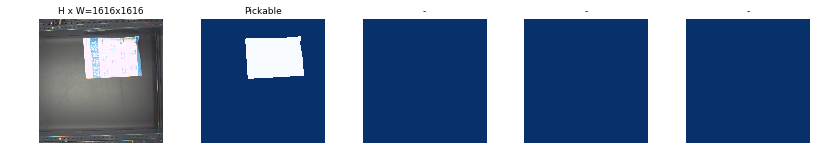

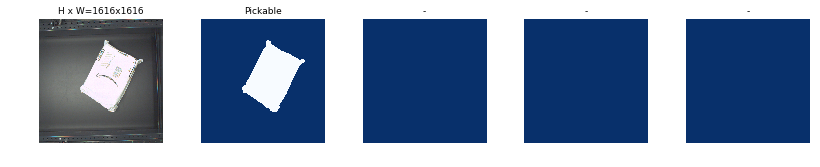

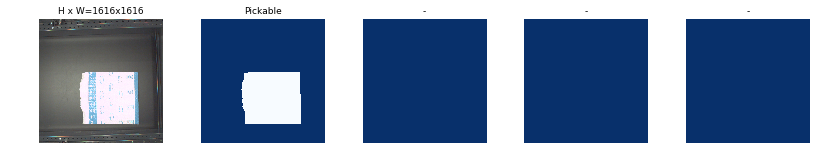

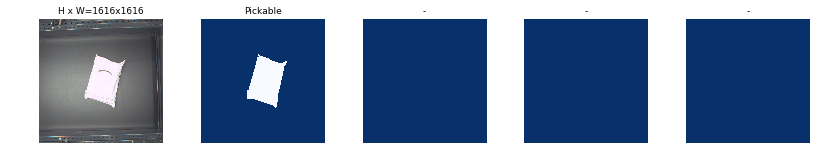

In [5]:
# Load and display random samples

image_ids = np.random.choice(dataset.image_ids, 4)
for image_id in image_ids:
    image = dataset.load_image(image_id)
    mask, class_ids = dataset.load_mask(image_id)
    visualize.display_top_masks(image, mask, class_ids, dataset.class_names)

image_id  121 /home/workspace/ML/Cascade_RCNN/data/balloon/train/15_02_2019_01_45_08_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png
image                    shape: (1616, 1616, 3)       min:    9.00000  max:  255.00000  uint8
mask                     shape: (1616, 1616, 1)       min:    0.00000  max:    1.00000  bool
class_ids                shape: (1,)                  min:    1.00000  max:    1.00000  int32
bbox                     shape: (1, 4)                min:  271.00000  max: 1451.00000  int32


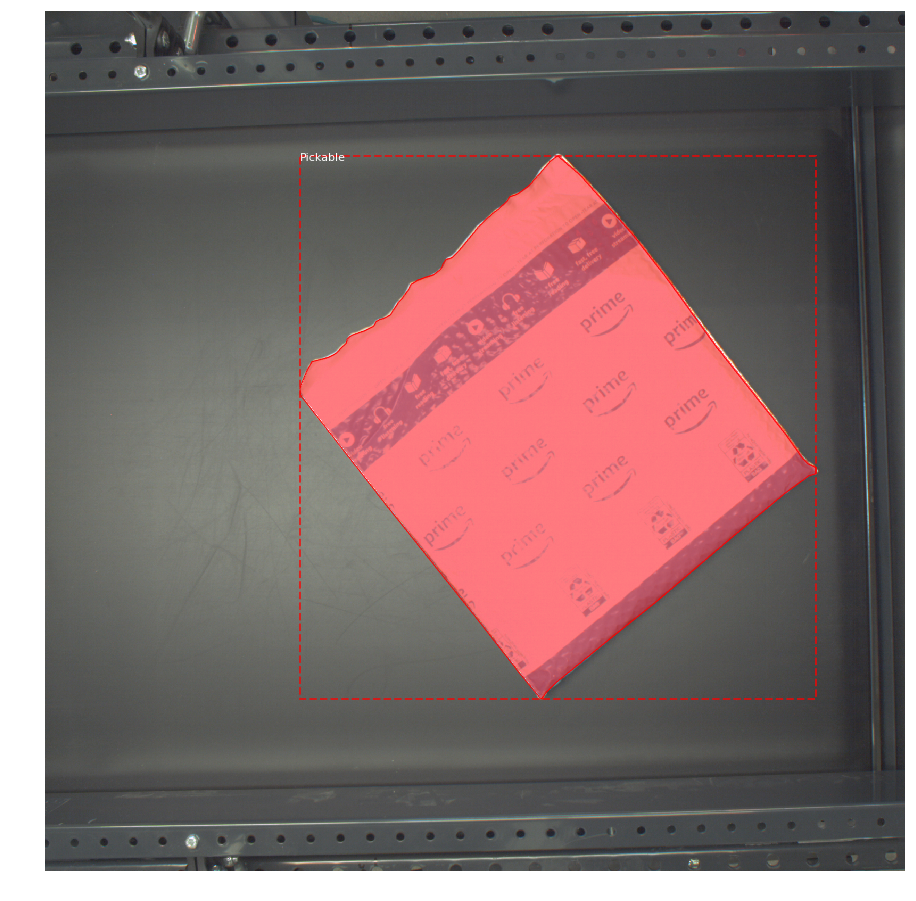

In [6]:
# Load random image and mask.
image_id = random.choice(dataset.image_ids)
image = dataset.load_image(image_id)
mask, class_ids = dataset.load_mask(image_id)
# Compute Bounding box
bbox = utils.extract_bboxes(mask)

# Display image and additional stats
print("image_id ", image_id, dataset.image_reference(image_id))
log("image", image)
log("mask", mask)
log("class_ids", class_ids)
log("bbox", bbox)
# Display image and instances
visualize.display_instances(image, bbox, mask, class_ids, dataset.class_names)

image_id:  22 /home/workspace/ML/Cascade_RCNN/data/balloon/train/15_02_2019_02_23_48_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png
Original shape:  (1616, 1616, 3)
image                    shape: (1024, 1024, 3)       min:   15.00000  max:  255.00000  uint8
mask                     shape: (1024, 1024, 1)       min:    0.00000  max:    1.00000  bool
class_ids                shape: (1,)                  min:    1.00000  max:    1.00000  int32
bbox                     shape: (1, 4)                min:  282.00000  max:  801.00000  int32


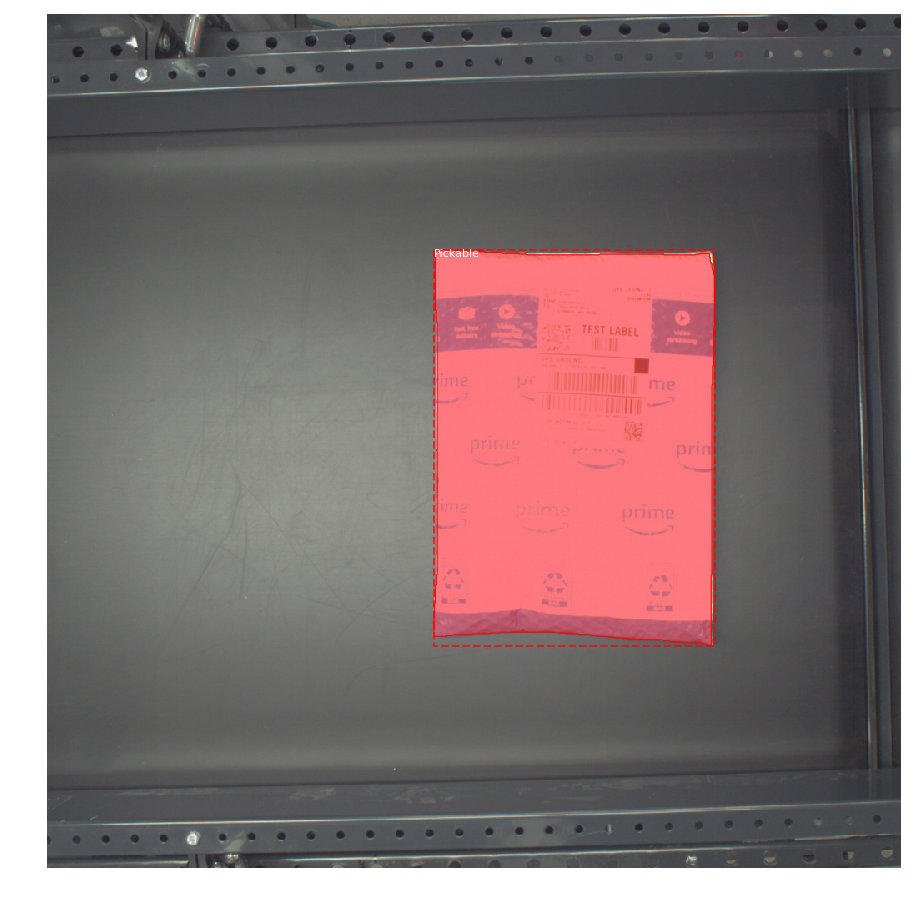

In [7]:
# Load random image and mask.
image_id = np.random.choice(dataset.image_ids, 1)[0]
image = dataset.load_image(image_id)
mask, class_ids = dataset.load_mask(image_id)
original_shape = image.shape
# Resize
image, window, scale, padding, _ = utils.resize_image(
    image, 
    min_dim=config.IMAGE_MIN_DIM, 
    max_dim=config.IMAGE_MAX_DIM,
    mode=config.IMAGE_RESIZE_MODE)
mask = utils.resize_mask(mask, scale, padding)
# Compute Bounding box
bbox = utils.extract_bboxes(mask)

# Display image and additional stats
print("image_id: ", image_id, dataset.image_reference(image_id))
print("Original shape: ", original_shape)
log("image", image)
log("mask", mask)
log("class_ids", class_ids)
log("bbox", bbox)
# Display image and instances
visualize.display_instances(image, bbox, mask, class_ids, dataset.class_names)

134
image                    shape: (1024, 1024, 3)       min:    5.00000  max:  255.00000  uint8
image_meta               shape: (14,)                 min:    0.00000  max: 1616.00000  float64
class_ids                shape: (2,)                  min:    1.00000  max:    1.00000  int32
bbox                     shape: (2, 4)                min:   86.00000  max:  957.00000  int32
mask                     shape: (1024, 1024, 2)       min:    0.00000  max:    1.00000  bool


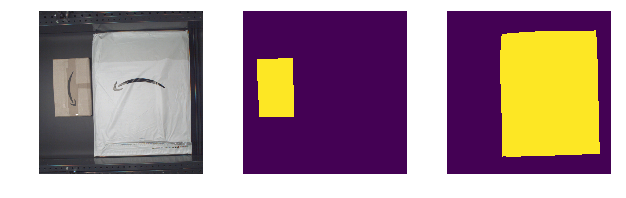

In [10]:
image_id = np.random.choice(dataset.image_ids, 1)[0]
print(image_id)
image, image_meta, class_ids, bbox, mask = modellib.load_image_gt(
    dataset, config, image_id, use_mini_mask=False)

log("image", image)
log("image_meta", image_meta)
log("class_ids", class_ids)
log("bbox", bbox)
log("mask", mask)

display_images([image]+[mask[:,:,i] for i in range(min(mask.shape[-1], 7))])

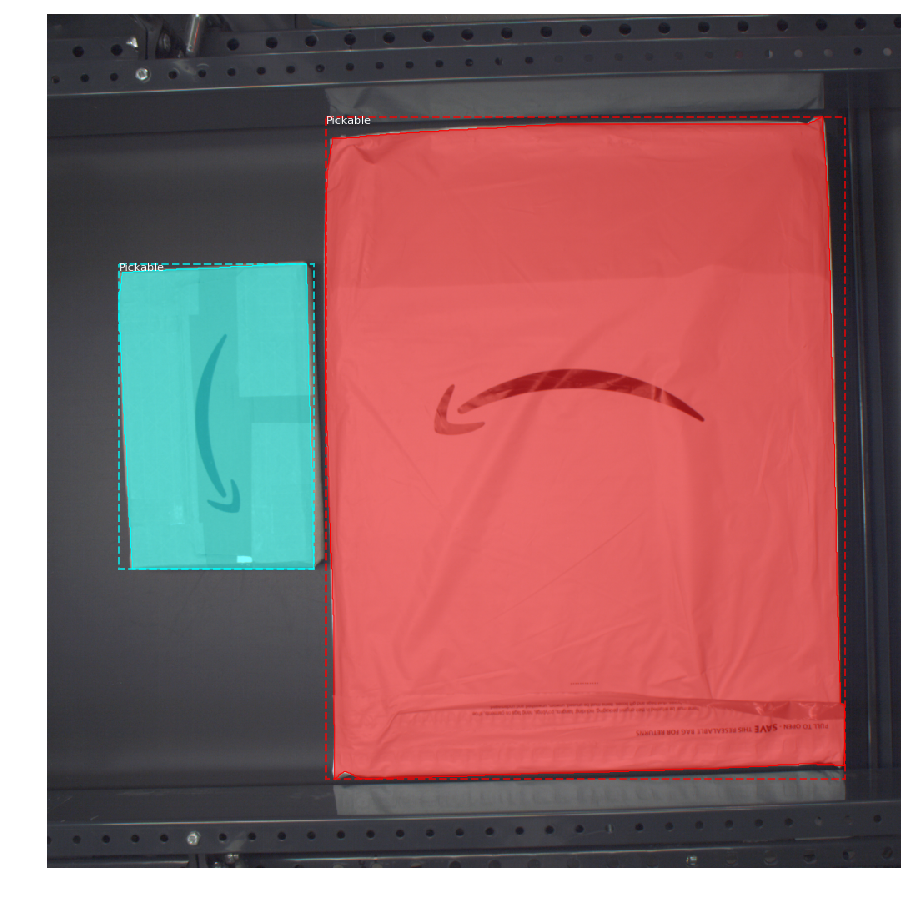

In [11]:
visualize.display_instances(image, bbox, mask, class_ids, dataset.class_names)

mask                     shape: (56, 56, 2)           min:    0.00000  max:    1.00000  bool


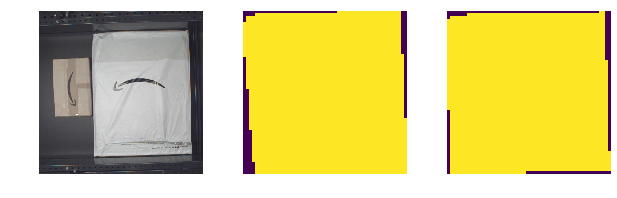

In [14]:
# Add augmentation and mask resizing.
image, image_meta, class_ids, bbox, mask = modellib.load_image_gt(
    dataset, config, image_id, augment=True, use_mini_mask=True)
log("mask", mask)
display_images([image]+[mask[:,:,i] for i in range(min(mask.shape[-1], 7))])

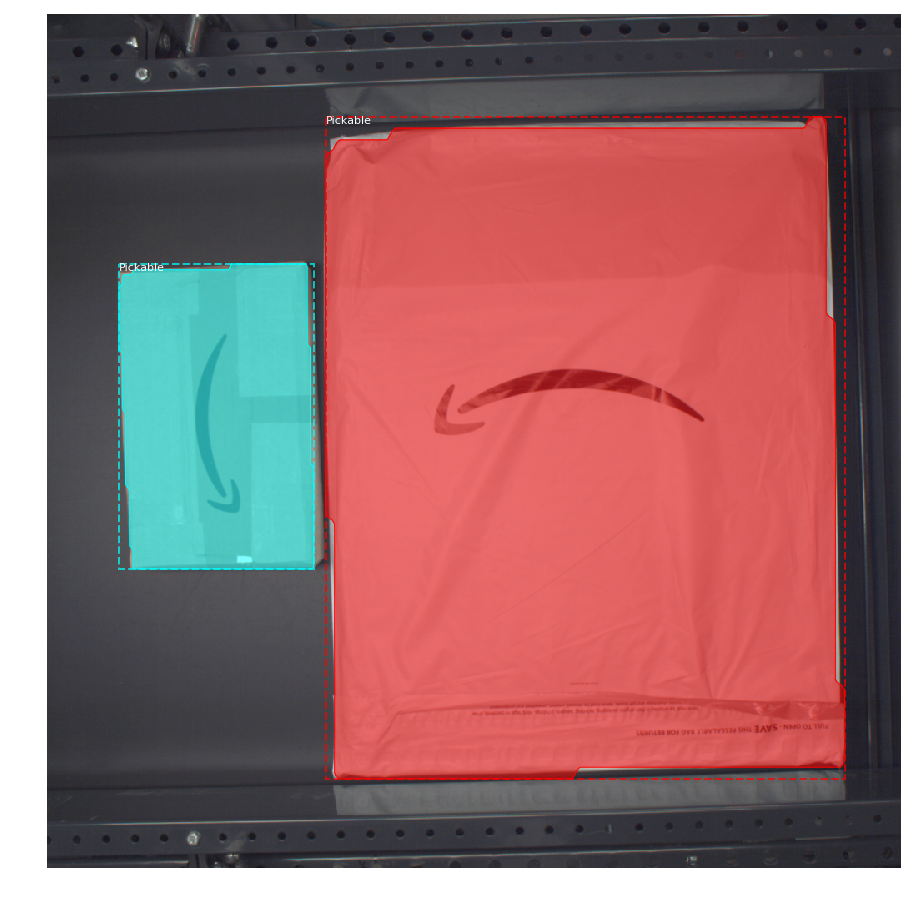

In [15]:
mask = utils.expand_mask(bbox, mask, image.shape)
visualize.display_instances(image, bbox, mask, class_ids, dataset.class_names)

## Anchors

The order of anchors is important. Use the same order in training and prediction phases. And it must match the order of the convolution execution.

For an FPN network, the anchors must be ordered in a way that makes it easy to match anchors to the output of the convolution layers that predict anchor scores and shifts. 
* Sort by pyramid level first. All anchors of the first level, then all of the second and so on. This makes it easier to separate anchors by level.
* Within each level, sort anchors by feature map processing sequence. Typically, a convolution layer processes a feature map starting from top-left and moving right row by row. 
* For each feature map cell, pick any sorting order for the anchors of different ratios. Here we match the order of ratios passed to the function.

**Anchor Stride:**
In the FPN architecture, feature maps at the first few layers are high resolution. For example, if the input image is 1024x1024 then the feature meap of the first layer is 256x256, which generates about 200K anchors (256*256*3). These anchors are 32x32 pixels and their stride relative to image pixels is 4 pixels, so there is a lot of overlap. We can reduce the load significantly if we generate anchors for every other cell in the feature map. A stride of 2 will cut the number of anchors by 4, for example. 

In this implementation we use an anchor stride of 2, which is different from the paper.

In [16]:
# Generate Anchors
backbone_shapes = modellib.compute_backbone_shapes(config, config.IMAGE_SHAPE)
anchors = utils.generate_pyramid_anchors(config.RPN_ANCHOR_SCALES, 
                                          config.RPN_ANCHOR_RATIOS,
                                          backbone_shapes,
                                          config.BACKBONE_STRIDES, 
                                          config.RPN_ANCHOR_STRIDE)

# Print summary of anchors
num_levels = len(backbone_shapes)
anchors_per_cell = len(config.RPN_ANCHOR_RATIOS)
print("Count: ", anchors.shape[0])
print("Scales: ", config.RPN_ANCHOR_SCALES)
print("ratios: ", config.RPN_ANCHOR_RATIOS)
print("Anchors per Cell: ", anchors_per_cell)
print("Levels: ", num_levels)
anchors_per_level = []
for l in range(num_levels):
    num_cells = backbone_shapes[l][0] * backbone_shapes[l][1]
    anchors_per_level.append(anchors_per_cell * num_cells // config.RPN_ANCHOR_STRIDE**2)
    print("Anchors in Level {}: {}".format(l, anchors_per_level[l]))

Count:  261888
Scales:  (32, 64, 128, 256, 512)
ratios:  [0.5, 1, 2]
Anchors per Cell:  3
Levels:  5
Anchors in Level 0: 196608
Anchors in Level 1: 49152
Anchors in Level 2: 12288
Anchors in Level 3: 3072
Anchors in Level 4: 768


Visualize anchors of one cell at the center of the feature map of a specific level.

Level 0. Anchors: 196608  Feature map Shape: [256 256]
Level 1. Anchors:  49152  Feature map Shape: [128 128]
Level 2. Anchors:  12288  Feature map Shape: [64 64]
Level 3. Anchors:   3072  Feature map Shape: [32 32]
Level 4. Anchors:    768  Feature map Shape: [16 16]


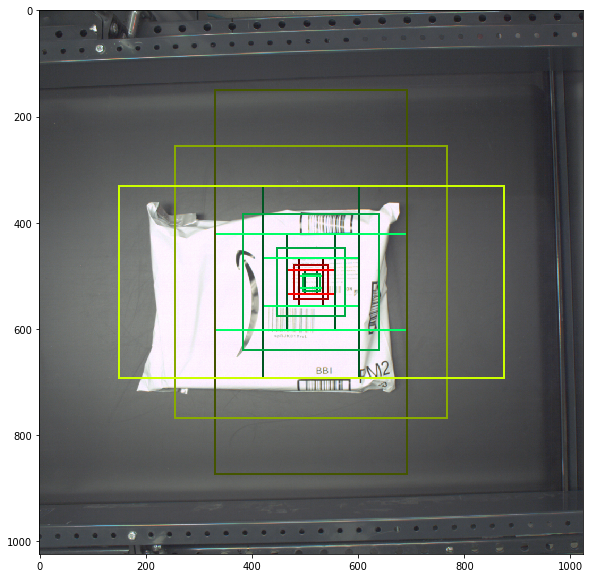

In [17]:
## Visualize anchors of one cell at the center of the feature map of a specific level

# Load and draw random image
image_id = np.random.choice(dataset.image_ids, 1)[0]
image, image_meta, _, _, _ = modellib.load_image_gt(dataset, config, image_id)
fig, ax = plt.subplots(1, figsize=(10, 10))
ax.imshow(image)
levels = len(backbone_shapes)

for level in range(levels):
    colors = visualize.random_colors(levels)
    # Compute the index of the anchors at the center of the image
    level_start = sum(anchors_per_level[:level]) # sum of anchors of previous levels
    level_anchors = anchors[level_start:level_start+anchors_per_level[level]]
    print("Level {}. Anchors: {:6}  Feature map Shape: {}".format(level, level_anchors.shape[0], 
                                                                  backbone_shapes[level]))
    center_cell = backbone_shapes[level] // 2
    center_cell_index = (center_cell[0] * backbone_shapes[level][1] + center_cell[1])
    level_center = center_cell_index * anchors_per_cell 
    center_anchor = anchors_per_cell * (
        (center_cell[0] * backbone_shapes[level][1] / config.RPN_ANCHOR_STRIDE**2) \
        + center_cell[1] / config.RPN_ANCHOR_STRIDE)
    level_center = int(center_anchor)

    # Draw anchors. Brightness show the order in the array, dark to bright.
    for i, rect in enumerate(level_anchors[level_center:level_center+anchors_per_cell]):
        y1, x1, y2, x2 = rect
        p = patches.Rectangle((x1, y1), x2-x1, y2-y1, linewidth=2, facecolor='none',
                              edgecolor=(i+1)*np.array(colors[level]) / anchors_per_cell)
        ax.add_patch(p)


## Data Generator


In [18]:
# Create data generator
random_rois = 2000
g = modellib.data_generator(
    dataset, config, shuffle=True, random_rois=random_rois, 
    batch_size=4,
    detection_targets=True)

In [19]:
# Uncomment to run the generator through a lot of images
# to catch rare errors
# for i in range(1000):
#     print(i)
#     _, _ = next(g)

In [20]:
# Get Next Image
if random_rois:
    [normalized_images, image_meta, rpn_match, rpn_bbox, gt_class_ids, gt_boxes, gt_masks, rpn_rois, rois], \
    [mrcnn_class_ids, mrcnn_bbox, mrcnn_mask] = next(g)
    
    log("rois", rois)
    log("mrcnn_class_ids", mrcnn_class_ids)
    log("mrcnn_bbox", mrcnn_bbox)
    log("mrcnn_mask", mrcnn_mask)
else:
    [normalized_images, image_meta, rpn_match, rpn_bbox, gt_boxes, gt_masks], _ = next(g)
    
log("gt_class_ids", gt_class_ids)
log("gt_boxes", gt_boxes)
log("gt_masks", gt_masks)
log("rpn_match", rpn_match, )
log("rpn_bbox", rpn_bbox)
image_id = modellib.parse_image_meta(image_meta)["image_id"][0]
print("image_id: ", image_id, dataset.image_reference(image_id))

# Remove the last dim in mrcnn_class_ids. It's only added
# to satisfy Keras restriction on target shape.
mrcnn_class_ids = mrcnn_class_ids[:,:,0]

rois                     shape: (4, 200, 4)           min:    0.00000  max: 1023.00000  int32
mrcnn_class_ids          shape: (4, 200, 1)           min:    0.00000  max:    1.00000  int32
mrcnn_bbox               shape: (4, 200, 2, 4)        min:   -3.04954  max:    3.26019  float32
mrcnn_mask               shape: (4, 200, 28, 28, 2)   min:    0.00000  max:    1.00000  float32
gt_class_ids             shape: (4, 100)              min:    0.00000  max:    1.00000  int32
gt_boxes                 shape: (4, 100, 4)           min:    0.00000  max:  827.00000  int32
gt_masks                 shape: (4, 56, 56, 100)      min:    0.00000  max:    1.00000  bool
rpn_match                shape: (4, 261888, 1)        min:   -1.00000  max:    1.00000  int32
rpn_bbox                 shape: (4, 256, 4)           min:   -1.78194  max:    1.11328  float64
image_id:  237 /home/workspace/ML/Cascade_RCNN/data/balloon/train/15_02_2019_01_45_53_BASLER_ACA2040_25GC_BASLERGIGE_22094717__IMAGE_RGB_RAW.png


anchors                  shape: (261888, 4)           min: -362.03867  max: 1322.03867  float64
refined_anchors          shape: (3, 4)                min:  214.00000  max:  827.00000  float32
Positive anchors: 3
Negative anchors: 253
Neutral anchors: 261632
BG                     : 134
Pickable               : 66


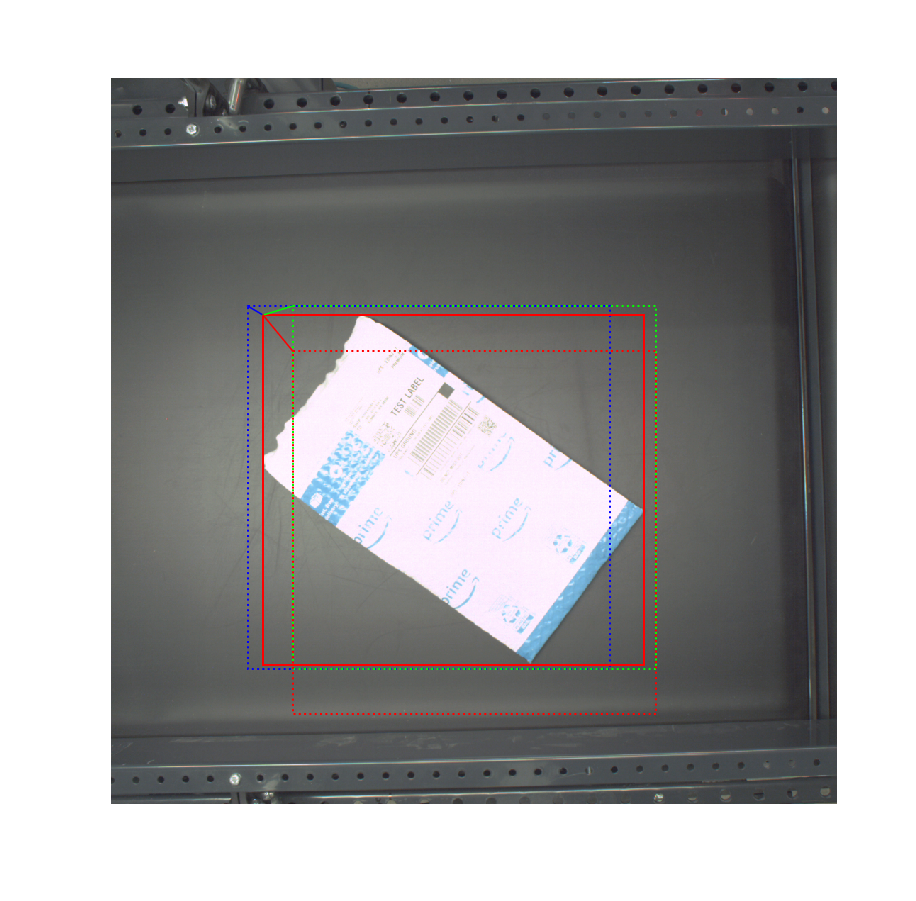

In [21]:
b = 0

# Restore original image (reverse normalization)
sample_image = modellib.unmold_image(normalized_images[b], config)

# Compute anchor shifts.
indices = np.where(rpn_match[b] == 1)[0]
refined_anchors = utils.apply_box_deltas(anchors[indices], rpn_bbox[b, :len(indices)] * config.RPN_BBOX_STD_DEV)
log("anchors", anchors)
log("refined_anchors", refined_anchors)

# Get list of positive anchors
positive_anchor_ids = np.where(rpn_match[b] == 1)[0]
print("Positive anchors: {}".format(len(positive_anchor_ids)))
negative_anchor_ids = np.where(rpn_match[b] == -1)[0]
print("Negative anchors: {}".format(len(negative_anchor_ids)))
neutral_anchor_ids = np.where(rpn_match[b] == 0)[0]
print("Neutral anchors: {}".format(len(neutral_anchor_ids)))

# ROI breakdown by class
for c, n in zip(dataset.class_names, np.bincount(mrcnn_class_ids[b].flatten())):
    if n:
        print("{:23}: {}".format(c[:20], n))

# Show positive anchors
fig, ax = plt.subplots(1, figsize=(16, 16))
visualize.draw_boxes(sample_image, boxes=anchors[positive_anchor_ids], 
                     refined_boxes=refined_anchors, ax=ax)

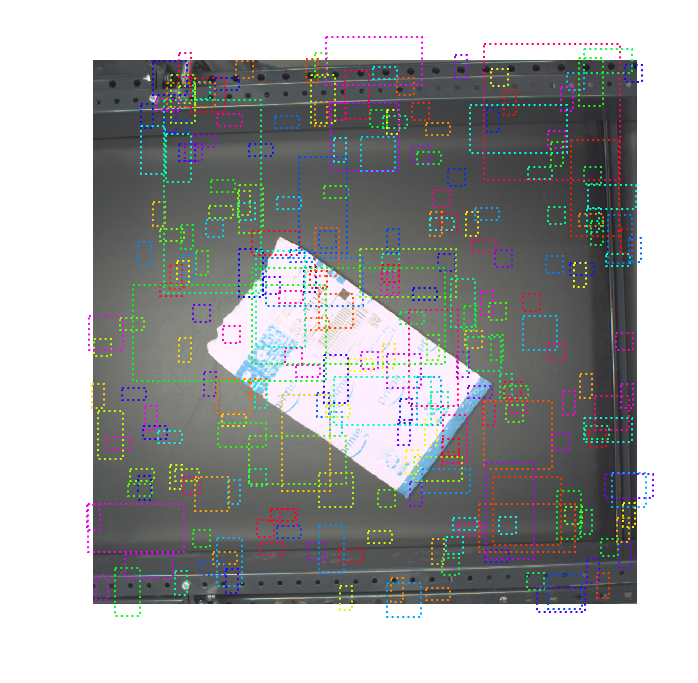

In [22]:
# Show negative anchors
visualize.draw_boxes(sample_image, boxes=anchors[negative_anchor_ids])

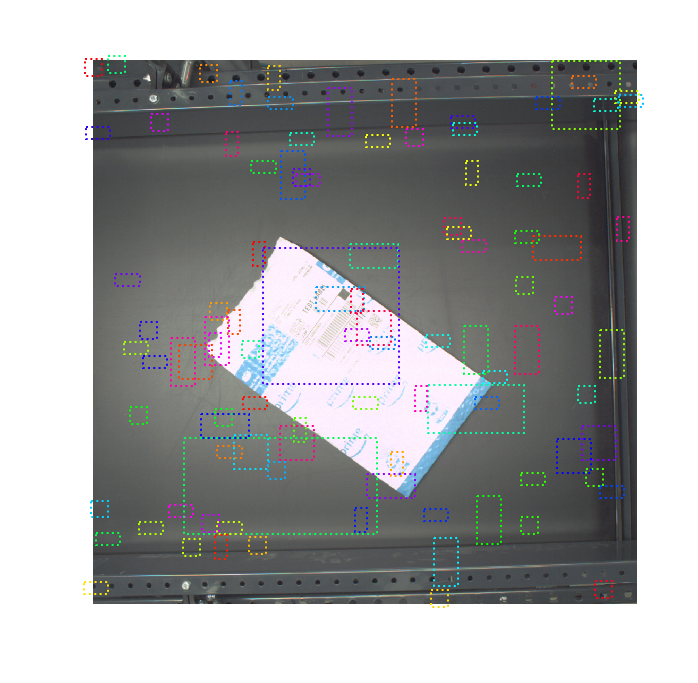

In [23]:
# Show neutral anchors. They don't contribute to training.
visualize.draw_boxes(sample_image, boxes=anchors[np.random.choice(neutral_anchor_ids, 100)])

## ROIs

Positive ROIs:  66
Negative ROIs:  134
Positive Ratio: 0.33
Unique ROIs: 200 out of 200


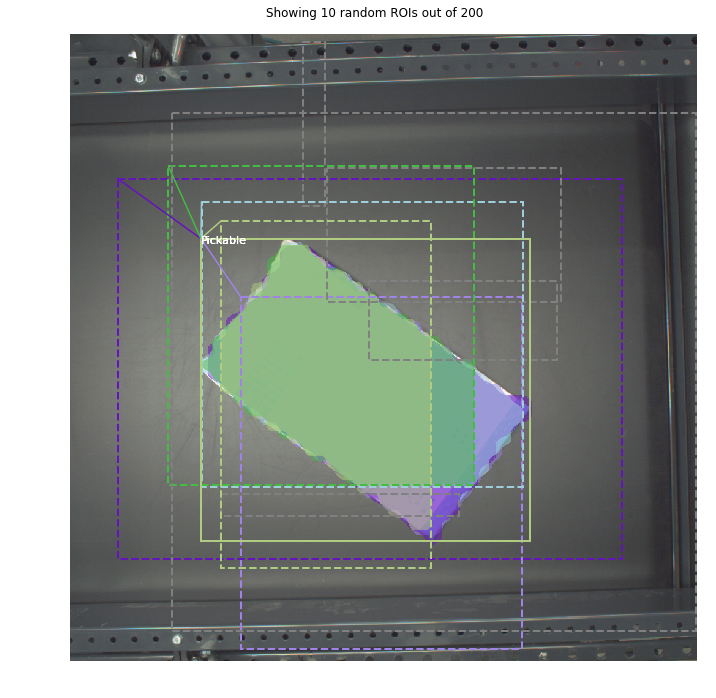

In [24]:
if random_rois:
    # Class aware bboxes
    bbox_specific = mrcnn_bbox[b, np.arange(mrcnn_bbox.shape[1]), mrcnn_class_ids[b], :]

    # Refined ROIs
    refined_rois = utils.apply_box_deltas(rois[b].astype(np.float32), bbox_specific[:,:4] * config.BBOX_STD_DEV)

    # Class aware masks
    mask_specific = mrcnn_mask[b, np.arange(mrcnn_mask.shape[1]), :, :, mrcnn_class_ids[b]]

    visualize.draw_rois(sample_image, rois[b], refined_rois, mask_specific, mrcnn_class_ids[b], dataset.class_names)
    
    # Any repeated ROIs?
    rows = np.ascontiguousarray(rois[b]).view(np.dtype((np.void, rois.dtype.itemsize * rois.shape[-1])))
    _, idx = np.unique(rows, return_index=True)
    print("Unique ROIs: {} out of {}".format(len(idx), rois.shape[1]))

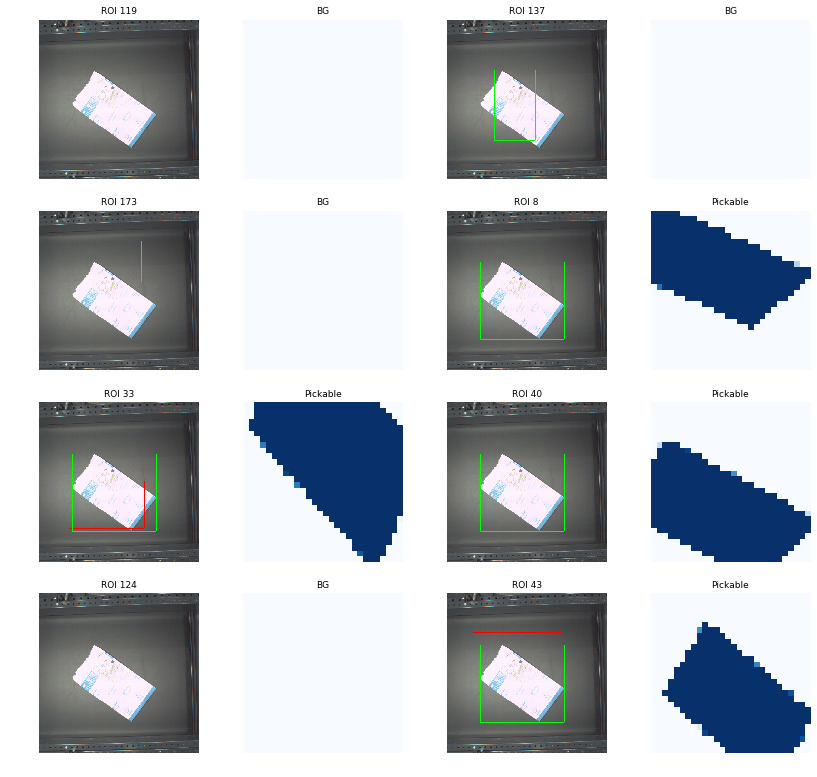

In [25]:
if random_rois:
    # Dispalay ROIs and corresponding masks and bounding boxes
    ids = random.sample(range(rois.shape[1]), 8)

    images = []
    titles = []
    for i in ids:
        image = visualize.draw_box(sample_image.copy(), rois[b,i,:4].astype(np.int32), [255, 0, 0])
        image = visualize.draw_box(image, refined_rois[i].astype(np.int64), [0, 255, 0])
        images.append(image)
        titles.append("ROI {}".format(i))
        images.append(mask_specific[i] * 255)
        titles.append(dataset.class_names[mrcnn_class_ids[b,i]][:20])

    display_images(images, titles, cols=4, cmap="Blues", interpolation="none")

In [26]:
# Check ratio of positive ROIs in a set of images.
if random_rois:
    limit = 10
    temp_g = modellib.data_generator(
        dataset, config, shuffle=True, random_rois=10000, 
        batch_size=1, detection_targets=True)
    total = 0
    for i in range(limit):
        _, [ids, _, _] = next(temp_g)
        positive_rois = np.sum(ids[0] > 0)
        total += positive_rois
        print("{:5} {:5.2f}".format(positive_rois, positive_rois/ids.shape[1]))
    print("Average percent: {:.2f}".format(total/(limit*ids.shape[1])))

   66  0.33
   66  0.33
   66  0.33
   66  0.33
   66  0.33
   66  0.33
   66  0.33
   66  0.33
   66  0.33
   66  0.33
Average percent: 0.33
